<a href="https://colab.research.google.com/github/pcfabre/VehicleDetection/blob/main/model_inference.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!git clone https://github.com/pcfabre/VehicleDetection.git 'content'

Cloning into 'content'...
remote: Enumerating objects: 10130, done.
remote: Counting objects: 100% (19/19), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 10130 (delta 4), reused 9 (delta 0), pack-reused 10111
Receiving objects: 100% (10130/10130), 580.96 MiB | 15.35 MiB/s, done.
Resolving deltas: 100% (23/23), done.
Updating files: 100% (13273/13273), done.


In [3]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-mkw0to1k
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-mkw0to1k
  Resolved https://github.com/facebookresearch/detectron2.git to commit 337ca3490fa7879ceeeadf6c2b73d67504ff4b4f
  Preparing metadata (setup.py) ... done


In [4]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.1 ; cuda:  cu118
detectron2: 0.6


In [10]:
try:
  import google.colab
  IN_COLAB = True
except:
  IN_COLAB = False

In [11]:
# import some common libraries
import json
import os
import cv2
import random
if IN_COLAB:
  from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
%matplotlib inline

In [12]:
# Setup detectron2 logger
import torch
import torchvision
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [13]:
# is there a gpu
cfg = get_cfg()
if torch.cuda.is_available():
    GPU = True
    print('gpu available')
else:
    GPU = False
    print('no gpu')

if GPU:
    pass
else:
    cfg.MODEL.DEVICE='cpu'

gpu available


# Train

Detectron supports COCO-type of annotations. The labels need to be transformed into a JSON file containing COCO annotations for processing.

In [14]:
import os
import numpy as np
from detectron2.structures import BoxMode

def create_COCO_annotations(root_path : str, dataset_path: str):


  annotations_path =  os.path.join(root_path, dataset_path, 'labels')
  annotations_files = os.listdir(annotations_path)

  dataset_dicts = []
  for idx, filename in enumerate(annotations_files):

    annotation_json = {}

    imagename = os.path.join(root_path, dataset_path, 'images', filename[:-4] + '.jpg')
    height, width = cv2.imread(imagename).shape[:2]

    annotation_json["file_name"] = imagename
    annotation_json["image_id"] = idx
    annotation_json["height"] = height
    annotation_json["width"] = width

    annotation_json["annotations"] = []

    annotations=np.loadtxt(os.path.join(annotations_path, filename))

    if len(annotations) == 0:
      pass
    if annotations.ndim == 1:
      annotations = annotations[:, np.newaxis]

    for row in annotations:
      if len(row) == 5:
        c_x, c_y, w_, h_ = row[1], row[2], row[3], row[4]

        bbox = [
          int((float(c_x) - (float(w_)/2)) * width),
          int((float(c_y) - (float(h_)/2)) * height),
          int(float(w_) * width),
          int(float(h_) * height),
        ]

        annotation_dict = {}
        annotation_dict["category_id"] = int(row[0])
        annotation_dict["bbox"] = bbox
        annotation_dict["bbox_mode"] = BoxMode.XYWH_ABS

        annotation_json["annotations"].append(annotation_dict)

    dataset_dicts.append(annotation_json)

  return dataset_dicts


In [15]:
def remove_registered(dataset_name: str):
  if dataset_name in DatasetCatalog.list():
    DatasetCatalog.remove(dataset_name)

remove_registered('TrainSet')
remove_registered('TestSet')
remove_registered('ValidSet')

In [16]:
from detectron2.data import DatasetCatalog
from functools import partial

classes_list = ['bicycle', 'bus', 'car', 'motorbike', 'person']

partial_create_COCO_train_annotations = partial(create_COCO_annotations, root_path="VehicleDetection", dataset_path="train")
partial_create_COCO_test_annotations = partial(create_COCO_annotations, root_path="VehicleDetection", dataset_path="test")

DatasetCatalog.register("TrainSet", partial_create_COCO_train_annotations)
DatasetCatalog.register("TestSet", partial_create_COCO_test_annotations)

In [17]:
from detectron2.data import MetadataCatalog

classes_list = ['bicycle', 'bus', 'car', 'motorbike', 'person']

_train_metadata = MetadataCatalog.get("TrainSet").set(thing_classes=classes_list)
_test_metadata = MetadataCatalog.get("TestSet").set(thing_classes=classes_list)
_train_metadata

namespace(name='TrainSet',
          thing_classes=['bicycle', 'bus', 'car', 'motorbike', 'person'])

In [18]:
NUM_CLASSES = len(_train_metadata.thing_classes)
print(f"{NUM_CLASSES} Number of classes in the dataset")

5 Number of classes in the dataset


<ipython-input-14-8e66b0287076>:26: UserWarning: loadtxt: input contained no data: "VehicleDetection/train/labels/screenshot_28917_jpg.rf.c5d20e6402f3af0ece470fc8f808d193.txt"
  annotations=np.loadtxt(os.path.join(annotations_path, filename))
<ipython-input-14-8e66b0287076>:26: UserWarning: loadtxt: input contained no data: "VehicleDetection/train/labels/screenshot_25192_jpg.rf.638d50576ef10ff247c7a5f9866649c0.txt"
  annotations=np.loadtxt(os.path.join(annotations_path, filename))
<ipython-input-14-8e66b0287076>:26: UserWarning: loadtxt: input contained no data: "VehicleDetection/train/labels/screenshot_8943_jpg.rf.836d3e415ddd7eb4903e3b3456584328.txt"
  annotations=np.loadtxt(os.path.join(annotations_path, filename))
<ipython-input-14-8e66b0287076>:26: UserWarning: loadtxt: input contained no data: "VehicleDetection/train/labels/screenshot_17143_jpg.rf.8c84a98ed7ff22e021061ac3578f24fd.txt"
  annotations=np.loadtxt(os.path.join(annotations_path, filename))
<ipython-input-14-8e66b028707

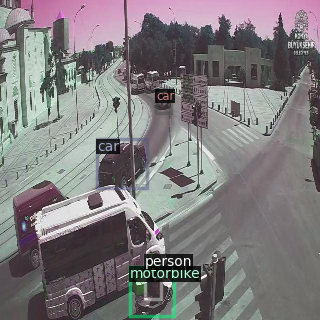

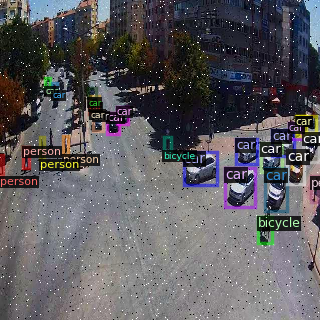

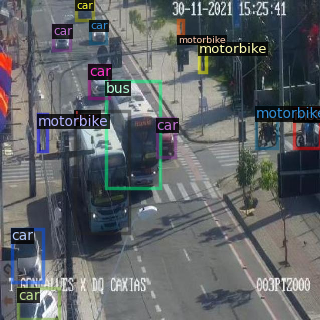

In [19]:
dataset_dict = create_COCO_annotations(root_path="VehicleDetection", dataset_path="train")

for d in random.sample(dataset_dict, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=_train_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    if IN_COLAB:
        cv2_imshow(out.get_image()[:, :, ::-1])
    else:
        plt.imshow(out.get_image()[:, :, ::-1])

Model Training

In [ ]:
from detectron2.engine import DefaultTrainer

if GPU:
    pass
else:
    cfg.MODEL.DEVICE='cpu'

In [ ]:
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("TrainSet",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2 #@param
cfg.DATALOADER.SAMPLER_TRAIN = "RepeatFactorTrainingSampler"
cfg.DATALOADER.REPEAT_THRESHOLD = 0.2
cfg.DATALOADER.FILTER_EMPTY_ANNOTATIONS = True
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH =  8 #@param
cfg.SOLVER.BASE_LR = 0.0025 #@param # pick a good LR
cfg.SOLVER.MAX_ITER = 150 #@param    # 300 iterations seems good enough for 100 frames dataset; you will need to train longer for a practical dataset
cfg.SOLVER.CHECKPOINT_PERIOD = 200 #@param
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 #@param   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES
cfg.DATASETS.PATH_TO_YOUR_DATASET = "VehicleDetection"  #  (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)


trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)

[11/05 19:26:51 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

<ipython-input-9-8e66b0287076>:26: UserWarning: loadtxt: input contained no data: "VehicleDetection/train/labels/screenshot_28917_jpg.rf.c5d20e6402f3af0ece470fc8f808d193.txt"
  annotations=np.loadtxt(os.path.join(annotations_path, filename))
<ipython-input-9-8e66b0287076>:26: UserWarning: loadtxt: input contained no data: "VehicleDetection/train/labels/screenshot_25192_jpg.rf.638d50576ef10ff247c7a5f9866649c0.txt"
  annotations=np.loadtxt(os.path.join(annotations_path, filename))
<ipython-input-9-8e66b0287076>:26: UserWarning: loadtxt: input contained no data: "VehicleDetection/train/labels/screenshot_8943_jpg.rf.836d3e415ddd7eb4903e3b3456584328.txt"
  annotations=np.loadtxt(os.path.join(annotations_path, filename))
<ipython-input-9-8e66b0287076>:26: UserWarning: loadtxt: input contained no data: "VehicleDetection/train/labels/screenshot_17143_jpg.rf.8c84a98ed7ff22e021061ac3578f24fd.txt"
  annotations=np.loadtxt(os.path.join(annotations_path, filename))
<ipython-input-9-8e66b0287076>:26

[11/05 19:27:28 d2.data.build]: Removed 216 images with no usable annotations. 5589 images left.


<ipython-input-9-8e66b0287076>:26: UserWarning: loadtxt: input contained no data: "VehicleDetection/train/labels/screenshot_8347_jpg.rf.29f9b7d514c5f58d2cb0272b57cef5ae.txt"
  annotations=np.loadtxt(os.path.join(annotations_path, filename))


[11/05 19:27:28 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[11/05 19:27:28 d2.data.build]: Using training sampler RepeatFactorTrainingSampler
[11/05 19:27:28 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[11/05 19:27:28 d2.data.common]: Serializing 5589 elements to byte tensors and concatenating them all ...
[11/05 19:27:28 d2.data.common]: Serialized dataset takes 3.14 MiB
WARNING [11/05 19:27:28 d2.solver.build]: SOLVER.STEPS contains values larger than SOLVER.MAX_ITER. These values will be ignored.
[11/05 19:27:28 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/retinanet_R_101_FPN_3x/190397697/model_final_971ab9.pkl ...


model_final_971ab9.pkl: 228MB [00:11, 19.9MB/s]                           
  pixel_mean
  pixel_std


In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
trainer.train()

[11/05 18:53:19 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/05 18:53:55 d2.utils.events]:  eta: 0:02:50  iter: 19  total_loss: 2.682  loss_cls: 1.638  loss_box_reg: 0.752  loss_rpn_cls: 0.1858  loss_rpn_loc: 0.1325    time: 1.3073  last_time: 1.3095  data_time: 0.1853  last_data_time: 0.0943   lr: 0.00031885  max_mem: 7289M
[11/05 18:54:28 d2.utils.events]:  eta: 0:02:26  iter: 39  total_loss: 1.807  loss_cls: 0.7802  loss_box_reg: 0.7977  loss_rpn_cls: 0.1194  loss_rpn_loc: 0.1174    time: 1.4140  last_time: 1.3331  data_time: 0.1471  last_data_time: 0.0944   lr: 0.00065185  max_mem: 7289M
[11/05 18:54:56 d2.utils.events]:  eta: 0:02:01  iter: 59  total_loss: 1.498  loss_cls: 0.5367  loss_box_reg: 0.773  loss_rpn_cls: 0.07907  loss_rpn_loc: 0.1046    time: 1.3975  last_time: 1.3611  data_time: 0.1298  last_data_time: 0.1012   lr: 0.00098485  max_mem: 7289M
[11/05 18:55:23 d2.utils.events]:  eta: 0:01:34  iter: 79  total_loss: 1.213  loss_cls: 0.4201  loss_box_reg: 0.6265  loss_rpn_cls: 0.06336  loss_rpn_loc: 0.08491    time: 1.3940  last_t

## Inference

In [ ]:
print(cfg.OUTPUT_DIR)

./output


In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously.
# We simply update the weights with the newly trained ones to perform inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
# set a custom testing threshold
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4   #@param {type: "slider", min:0.0, max:1.0, step: 0.01}
predictor = DefaultPredictor(cfg)

[11/05 19:13:54 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [ ]:
from detectron2.utils.visualizer import ColorMode

In [ ]:
partial_create_COCO_valid_annotations = partial(create_COCO_annotations, root_path="VehicleDetection", dataset_path="valid")
DatasetCatalog.register("ValidSet", partial_create_COCO_valid_annotations)
_validation_metadata = MetadataCatalog.get("ValidSet").set(thing_classes=classes_list)

<ipython-input-9-8e66b0287076>:26: UserWarning: loadtxt: input contained no data: "VehicleDetection/valid/labels/screenshot_596_jpg.rf.211824bf6cad7f8e556d46267afd5cdf.txt"
  annotations=np.loadtxt(os.path.join(annotations_path, filename))
<ipython-input-9-8e66b0287076>:26: UserWarning: loadtxt: input contained no data: "VehicleDetection/valid/labels/screenshot_447_jpg.rf.51e3bba53cbfdde8ccc6ba63895b8eae.txt"
  annotations=np.loadtxt(os.path.join(annotations_path, filename))
<ipython-input-9-8e66b0287076>:26: UserWarning: loadtxt: input contained no data: "VehicleDetection/valid/labels/screenshot_2389_jpg.rf.d0633d8510b855c2e1b830b3279ece9a.txt"
  annotations=np.loadtxt(os.path.join(annotations_path, filename))
<ipython-input-9-8e66b0287076>:26: UserWarning: loadtxt: input contained no data: "VehicleDetection/valid/labels/screenshot_33835_jpg.rf.fa13ae6b06cb73721848f45e90845550.txt"
  annotations=np.loadtxt(os.path.join(annotations_path, filename))
<ipython-input-9-8e66b0287076>:26: Us

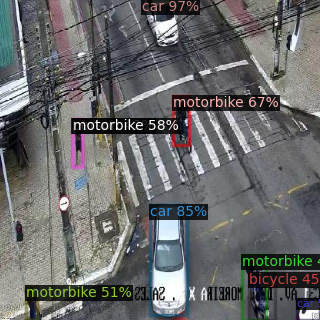

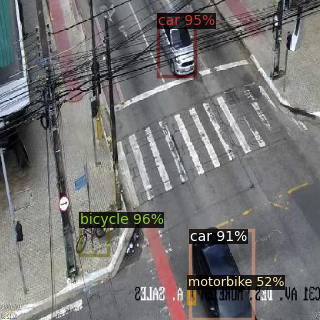

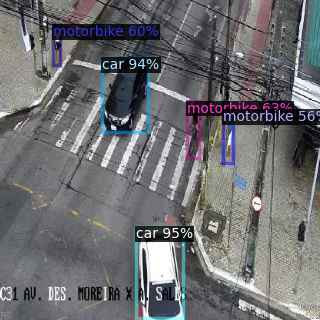

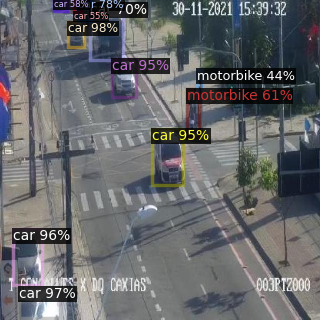

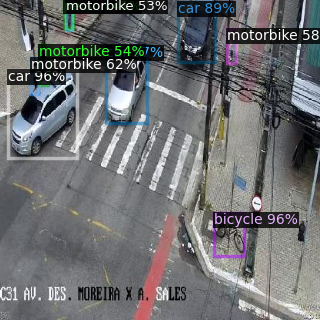

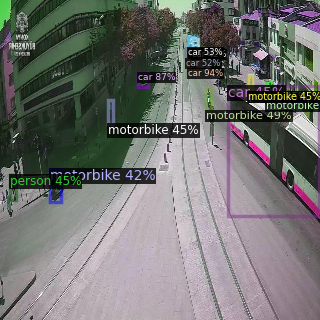

In [ ]:
dataset_dict = create_COCO_annotations(root_path="VehicleDetection", dataset_path="valid")

for d in random.sample(dataset_dict, 6):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=_validation_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.SEGMENTATION   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    if IN_COLAB:
        cv2_imshow(out.get_image()[:, :, ::-1])
    else:
        plt.imshow(out.get_image()[:, :, ::-1])
        plt.show()
